In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm, SymLogNorm, TwoSlopeNorm
import matplotlib.colors as colors
import qcodes as qc
import qcodes.instrument_drivers.nplab_drivers as npd
from scipy.optimize import curve_fit
from scipy.interpolate import interp2d, interp1d
from os import path
import colorcet as cc   # install quickly with "conda install colorcet"
from scipy.interpolate import RectBivariateSpline
from matplotlib import ticker
from scipy.ndimage import gaussian_filter
import matplotlib as mpl
from lmfit import Model
import scipy.signal.windows as windows
from matplotlib.lines import Line2D
import lmfit
import glob

In [2]:
# %matplotlib widget

In [3]:
cd ..

/Users/robertpolski/Documents/NPGroupResearch/Measurements/Triton/qcodes_data


In [4]:
qc.DataSet.default_io.base_location = path.abspath('.')
figfile = path.abspath('.') + '/Figures/FerromagnetismPomeranchukPaper/'

In [5]:
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['figure.dpi'] = 300
%config InlineBackend.figure_format = 'svg'  # with this, we need to raster the pcolormesh images with rasterized=True
# and save with .svg in the filename. don't worry. The annoying white line/offset in the image doesn't seem to show up if you use dpi=something while saving

In [6]:
font = {
                'family': 'Arial',
                'size': 12,
                'serif': 'Times',
                'sans-serif': 'Arial'
            }

plt.rc('font', **font)

In [7]:
muB = 9.274e-24
kB = 1.381e-23

# S13

## Fan diagram

In [8]:
dfan1 = qc.load_data('data/2020-12-02/#001_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_10-00-27') # use :46
dfan2 = qc.load_data('data/2020-12-05/#002_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_21-12-35') # use :60
dfan3 = qc.load_data('data/2020-12-07/#001_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_02-19-23')

In [9]:
Bfan = np.concatenate((dfan1.triton_field_set_stable_set[:44], dfan2.triton_field_set_stable_set[:58], dfan3.triton_field_set_stable_set[:-1], [8]))
vbgfan = dfan1.srframe_volt_p1_set[0, :]
Rxxfan225 = np.vstack((npd.Rxxfromdata(dfan1, 1e-9, 'lockin830')[:44, :], npd.Rxxfromdata(dfan2, 1e-9, 'lockin830')[:58, :], npd.Rxxfromdata(dfan3, 1e-9, 'lockin830')))
Rxxfan292 = np.vstack((npd.Rxxfromdata(dfan1, 1e-9, 'lockin830_3')[:44, :], npd.Rxxfromdata(dfan2, 1e-9, 'lockin830_3')[:58, :], npd.Rxxfromdata(dfan3, 1e-9, 'lockin830_3')))

### Contacts 2-25 1.10$^\circ$

In [10]:
sl = 11.6
def plotline(slope, xintercept, Bl, Bs, *args, **kwargs):
    "Note that slope is actually 1/(actual slope)"
    b = -xintercept*sl
    x = np.linspace((Bs*slope - b)/sl, (Bl*slope - b)/sl, 5)
    plt.plot(x, (x*sl + b)/slope, *args, **kwargs)

/var/folders/l1/53s29dh101l56cxljg7vp9dm0000gn/T/ipykernel_54620/1811342400.py:6: RuntimeWarning: invalid value encountered in true_divide
  plt.plot(x, (x*sl + b)/slope, *args, **kwargs)
/var/folders/l1/53s29dh101l56cxljg7vp9dm0000gn/T/ipykernel_54620/1811342400.py:6: RuntimeWarning: invalid value encountered in true_divide
  plt.plot(x, (x*sl + b)/slope, *args, **kwargs)


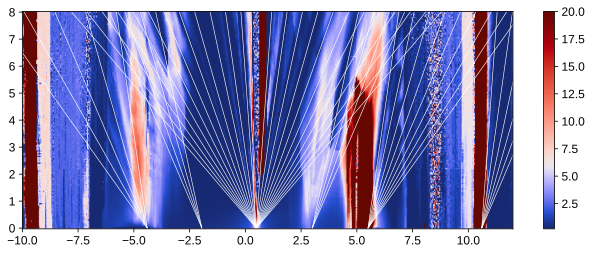

In [11]:
plt.figure(figsize=(11, 4))
plt.pcolormesh(vbgfan, Bfan, Rxxfan225/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(6, 0.2, 20), rasterized=True)
plt.colorbar()
# plt.xlim(0, 7)
plt.xlim(-10, 12)

# plt.ylim(0, 3)

for i in range(-12, 13):
    plotline(i, 0.49, 8, 0, color='white', lw=0.6)
    
for i in range(7):
    plotline(i, 10.6, 0, 8, color='white', lw=0.6)
    
for i in [2, 3, 4, 5, 6, 7, 8, 9, 10]:
    plotline(i, 5.5, 0, 8, color='white', lw=0.6)
    
for i in [3, 4, 5, 6]:
    plotline(i, 3.0, 0, 8, color='white', lw=0.6)
    
# for i in [2, 3, 4, 5, 6]:
#     plotline(i, 2.7, 0, 8, color='white', lw=0.6)
    
for i in [-2, -4, -6, -8, -10]:
    plotline(i, -4.4, 0, 8, color='white', lw=0.6)
    
for i in [-3, -4, -5, -6]:
    plotline(i, -1.95, 0, 8, color='white', lw=0.6)
    
# plt.axis(ab)

In [12]:
V0 = 0.49
Vgatefull = 10.04 #use the +half filling point to determine this, since everything else changes so much
sl = 11.6
C = sl*1.602e-19**2/6.626e-34
print('Capacitance C: {:.4e} F/m^2'.format(C))
dbn = 8.85e-12*3/C*1e9
print('hBN effective thickness: {:.2f} nm'.format(dbn))
nfull = sl*1.602e-19/6.626e-34*Vgatefull*1e-4
print('Full filling density: {:.4f} 10^12 cm^-2'.format(nfull/1e12))
a = 0.246e-9
theta = np.sqrt(np.sqrt(3)*nfull*10**4*a**2/8)*180/np.pi
print('Theta = {:.3f} degrees'.format(theta))

Capacitance C: 4.4929e-04 F/m^2
hBN effective thickness: 59.09 nm
Full filling density: 2.8158 10^12 cm^-2
Theta = 1.101 degrees


In [13]:
# potential secondary twist angle
Vgatefull2 = (2.7-V0)*4 # using the quarter-filling smaller gate point
nfull2 = sl*1.602e-19/6.626e-34*Vgatefull2*1e-4
print('Full filling density: {:.4f} 10^12 cm^-2'.format(nfull2/1e12))
a = 0.246e-9
theta2 = np.sqrt(np.sqrt(3)*nfull2*10**4*a**2/8)*180/np.pi
print('Theta = {:.3f} degrees'.format(theta2))

Full filling density: 2.4793 10^12 cm^-2
Theta = 1.033 degrees


In [14]:
nu225 = np.interp(vbgfan, [V0 - 7/4*Vgatefull, V0 + 7/4*Vgatefull], [-7, 7])

In [15]:
indices = [i not in (21, 22) for i in range(len(Bfan))]

In [16]:
Rxx225func = RectBivariateSpline(nu225, Bfan[indices], Rxxfan225[indices, :].T, kx=1, ky=1)

(-4.0, 4.0)

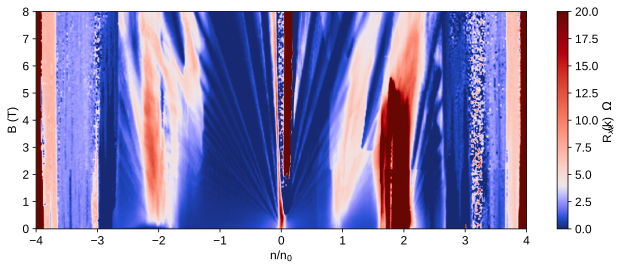

In [17]:
x = np.linspace(-4, 4, 1201)
y = np.linspace(0, 8, 601)

plt.figure(figsize=(11, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxx225func(x, y).T/1000, (0.9, 0.9)), cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(4, 0, 20), rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel('n/n$_{0}$')
plt.ylabel('B (T)')
plt.xlim(-4, 4)

In [18]:
Vgatefull2

8.84

(-4.0, 4.0)

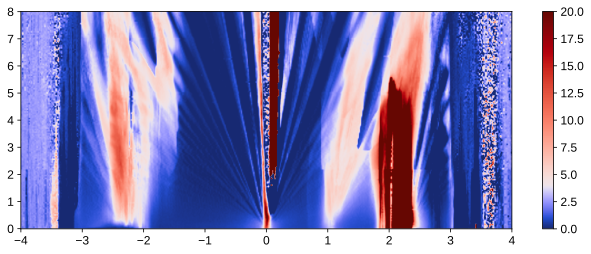

In [19]:
# try again with the assumption that we're at the second angle
x = np.linspace(-4, 4, 1201)
y = np.linspace(0, 8, 601)

plt.figure(figsize=(11, 4))
plt.pcolormesh(x*Vgatefull/Vgatefull2, y, Rxx225func(x, y).T/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(4, 0, 20), rasterized=True)
plt.colorbar()
plt.xlim(-4, 4)

(-10.0, 12.0)

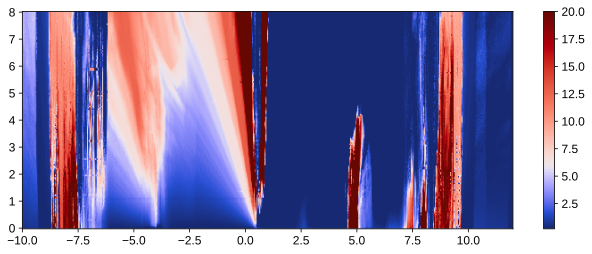

In [20]:
plt.figure(figsize=(11, 4))
plt.pcolormesh(vbgfan, Bfan, Rxxfan292/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(6, 0.2, 20), rasterized=True)
plt.colorbar()
# plt.xlim(0, 7)
plt.xlim(-10, 12)

## T-dependence

In [23]:
dT0 = qc.load_data('data/2020-12-03/#004_S13_865_3-2_830_2-25_8302_4-3_base_1nA_gatesweep_11-31-59')
dT1 = qc.load_data('data/2020-12-03/#005_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweepto1K_11-50-09')
dT2 = qc.load_data('data/2020-12-03/#006_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep1p05to1p4K_17-12-31')
dT3 = qc.load_data('data/2020-12-03/#007_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep1p45to2K_19-21-48')
dT4 = qc.load_data('data/2020-12-03/#008_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep2p1to10K_22-51-46')
dT5 = qc.load_data('data/2020-12-04/#001_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep10p5to30K_20-18-38')
dT6 = qc.load_data('data/2020-12-05/#001_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep30p5to40K_07-42-45')

In [24]:
Ts = np.concatenate(([0.025], dT1.triton_pid_setpoint_set[:], dT2.triton_pid_setpoint_set[:], dT3.triton_pid_setpoint_set[:], dT4.triton_pid_setpoint_set[:], dT5.triton_pid_setpoint_set[:], dT6.triton_pid_setpoint_set[:]))
nuT225 = np.interp(dT0.srframe_volt_p1_set[:], [V0 - 6/4*Vgatefull, V0 + 6/4*Vgatefull], [-6, 6])
RxxT225 = np.vstack((npd.Rxxfromdata(dT0, 1e-9, 'lockin830'), npd.Rxxfromdata(dT1, 1e-9, 'lockin830'), npd.Rxxfromdata(dT2, 1e-9, 'lockin830'), npd.Rxxfromdata(dT3, 1e-9, 'lockin830'), npd.Rxxfromdata(dT4, 1e-9, 'lockin830'), npd.Rxxfromdata(dT5, 1e-9, 'lockin830'), npd.Rxxfromdata(dT6, 1e-9, 'lockin830')))

(-4, 4)

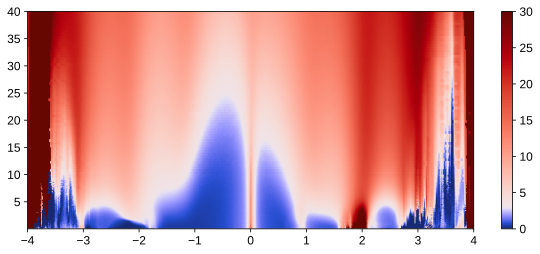

In [25]:
plt.figure(figsize=(10, 4))
plt.pcolormesh(nuT225-0.008, Ts, RxxT225/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(3, 0, 30), rasterized=True)
plt.colorbar()
plt.xlim(-4, 4)

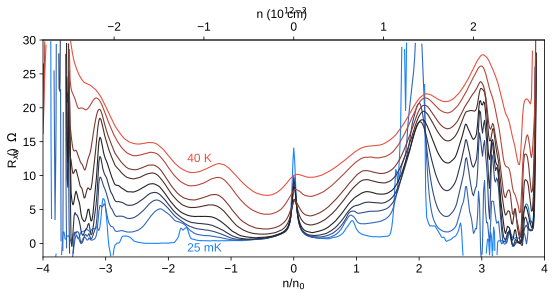

In [35]:
itlist = [0, 50, 70, 90, 120, 130, 140, 160, 180]
lw=1.1
N = len(itlist)
cs = cc.cm.bkr([i/(N-1) for i in range(N)])

ymin, ymax = -2, 30

xvals = np.linspace(-4, 4, 2001)

fig, ax = plt.subplots(1, 1, figsize=(9, 4))
for i in range(N):
    indx = itlist[i]
    yvals = np.interp(xvals, nuT225, gaussian_filter(RxxT225[indx]/1000, 0.8))
    ax.plot(xvals, np.ma.masked_outside(yvals, ymin, ymax), color=cs[i], lw=lw, label='{} K'.format(Ts[indx]))
    
# plt.legend()
ax.axis((-4, 4, ymin, ymax))
ax.text(-1.7, -1.2, '25 mK', color=cs[0])
ax.text(-1.7, 12, '40 K', color=cs[-1])
ax.set_xlabel('n/n$_0$')
ax.set_ylabel('R$_{xx}$ ($\Omega$)')

# make the top axis the raw density

def fillton(fill):
    return fill*2.7915/4

def ntofill(n):
    return n*4/2.7915


tax = ax.secondary_xaxis('top', functions=(fillton, ntofill))
tax.set_xlabel('n (10$^{12}$ cm$^{-2}$)')

# plt.savefig(figfile + 'LinePlotTs.svg', dpi=300, bbox_inches='tight')

## Some gap finding

In [25]:
nuT225[413]

2.00796812749004

In [27]:
plt.figure()
# nu = +2
plt.semilogy(1/Ts, RxxT225[:, 413], '.')
n1, n2 = 47, 73
plt.semilogy(1/Ts[n1:n2], RxxT225[n1:n2, 413], '.')
sl1, b1 = np.polyfit(1/Ts[n1:n2], np.log(RxxT225[n1:n2, 413]), 1)
x = np.linspace(0.15, 0.58, 30)
plt.semilogy(x, np.exp(sl1*x + b1))

print('Gap for nu=+2: {:.3f} meV'.format(sl1*2*1.381e-23/1.602e-19*1000))

# plt.axis(ab)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Gap for nu=+2: 0.780 meV


In [28]:
ab = plt.axis()

In [29]:
nuT225[99]

-2.9960159362549805

Nu = -3 has a little something around 1K, but it's pretty imprecise

The only interesting thing at nu = +1 is the fact that there's a bistability

In [30]:
# nu = -3
plt.figure()
R = np.average(RxxT225[:, 96:100], axis=1)
plt.semilogy(1/Ts, R, '.')
plt.axis(ab)
n1, n2 = 12, 22
plt.semilogy(1/Ts[n1:n2], R[n1:n2], '.')
sl2, b2 = np.polyfit(1/Ts[n1:n2], np.log(R[n1:n2]), 1)
x = np.linspace(0.9, 2, 30)
plt.semilogy(x, np.exp(sl2*x + b2))

print('Gap for nu=-3: {:.3f} meV'.format(sl2*2*1.381e-23/1.602e-19*1000))

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Gap for nu=-3: 0.103 meV


In [31]:
ab = plt.axis()

In [32]:
nuT225[350]

1.00398406374502

In [33]:
plt.figure()
for i in range(10):
    plt.semilogy(1/Ts, RxxT225[:, 340 + i], '.')
# plt.axis(ab)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [34]:
ab = plt.axis()

In [35]:
plt.figure(figsize=(10, 4))
plt.pcolormesh(nuT225 - 0.008, Ts, RxxT225/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(2, 0, 20))
plt.colorbar()
plt.axis((-4, 4, 0, 10))

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(-4, 4, 0, 10)

In [36]:
plt.figure(figsize=(10, 4))
plt.pcolormesh(nuT225 - 0.008, Ts, RxxT225/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(2, 0, 20))
plt.colorbar()
plt.axis((-4, 4, 0, 4))

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(-4, 4, 0, 4)

In [37]:
nuT225[145]

-2.262948207171315

In [38]:
plt.figure()
for i in range(7):
    plt.plot(Ts, RxxT225[:, 145 + i], label=nuT225[145 + i])
    
plt.legend()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [39]:
nuT225[440]

2.4382470119521926

In [40]:
plt.figure()
for i in range(12):
    plt.plot(Ts, RxxT225[:, 430 + i], label=nuT225[430 + i])
    
plt.legend()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [41]:
# With the second angle assumed
plt.figure(figsize=(10, 4))
plt.pcolormesh(nuT225*Vgatefull/Vgatefull2 - 0.01, Ts, RxxT225/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(2, 0, 20))
plt.colorbar()
plt.axis((-4, 4, 0, 10))

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(-4, 4, 0, 10)

## near 1/4

In [21]:
dxy2d = qc.load_data('data/2020-12-14/#034_S13_865_29-28_830_25-28_2nA_baseT_B-n_1quarter_21-58-42')

rxy2d = dxy2d.lockin830_X[:, :]/2e-9
g = dxy2d.srframe_volt_p1_set[0, :]
B = dxy2d.triton_field_set_stable_set[:]

In [22]:
B[100]

0.0

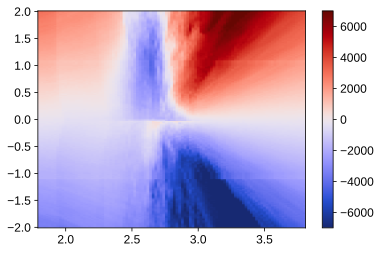

In [23]:
plt.figure() # raw
plt.pcolormesh(g, B, rxy2d, cmap=cc.cm.diverging_bwr_20_95_c54, vmin=-7000, vmax=7000, rasterized=True)
plt.colorbar()

In [24]:
esqh = 1.602e-19**2/6.626e-34

/var/folders/l1/53s29dh101l56cxljg7vp9dm0000gn/T/ipykernel_54620/2909581289.py:2: RuntimeWarning: divide by zero encountered in true_divide
  plt.pcolormesh(g, B, 1/(rxy2d)/esqh, cmap=cc.cm.diverging_bwr_20_95_c54, vmin=-20, vmax=20, rasterized=True)


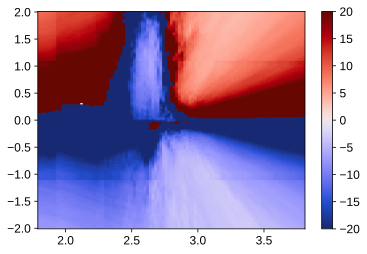

In [25]:
plt.figure() # raw
plt.pcolormesh(g, B, 1/(rxy2d)/esqh, cmap=cc.cm.diverging_bwr_20_95_c54, vmin=-20, vmax=20, rasterized=True)
plt.colorbar()

In [26]:
Rxysym = (rxy2d[:101, :] - np.flip(rxy2d[100:, :], axis=0))/2

(2.25, 3.76, 0.0, 2.0)

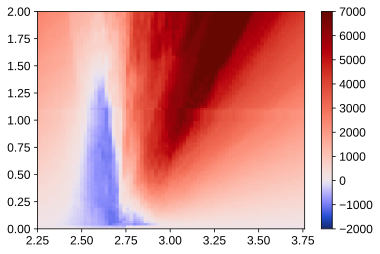

In [36]:
plt.figure()
plt.pcolormesh(g, B[:101], Rxysym, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, vmin=-2000, vmax=7000), rasterized=True)
plt.colorbar()
plt.axis((2.25, 3.76, 0, 2))

# sl 
# x = np.array([2.8, 2.4])
# plt.plot(x, x*-15 + 38, color='white')

## The 1/4 FM state

In [37]:
flist = sorted(glob.glob('data/2020-12-09/#*/'))[8:] + sorted(glob.glob('data/2020-12-10/#*/'))[:50]

In [38]:
flist[0]

'data/2020-12-09/#009_S13_865_2-25_830_25-28_8302_2-29_vbg1p8V_FieldSweepdown_1nA_17-48-35/'

In [39]:
1/800

0.00125

In [40]:
Bint = np.linspace(-0.5, 0.5, 801)
Vbg = np.linspace(1.8, 3.48, 43)
upsweeps = np.zeros((int(len(flist)/2), len(Bint)))
downsweeps = np.zeros((int(len(flist)/2), len(Bint)))
for i in range(int(len(flist)/2)):
    dup = qc.load_data(flist[2*i + 1][:-1])
    ddown = qc.load_data(flist[2*i][:-1])
    dupint = np.where(np.isnan(dup.triton_field[:]))[0][0]
    ddownint = np.where(np.isnan(ddown.triton_field[:]))[0][0]
    Bup = dup.triton_field[:dupint]
    Bdown = ddown.triton_field[:ddownint]
    upsweeps[i, :] = np.interp(Bint, Bup, dup.lockin830_X[:dupint])/1e-9
    downsweeps[i, :] = np.interp(Bint, Bdown[::-1], ddown.lockin830_X[:ddownint][::-1])/1e-9

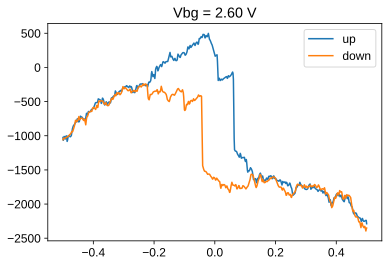

In [41]:
plt.figure()
plt.plot(Bint, upsweeps[20], label='up')
plt.plot(Bint, downsweeps[20], label='down')
plt.title('Vbg = {:.2f} V'.format(Vbg[20]))
plt.legend()

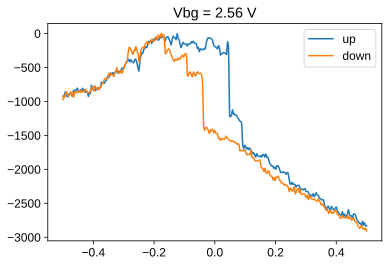

In [42]:
plt.figure()
indx = 19
# avg = (upsweeps[indx] + downsweeps[indx])/2
plt.plot(Bint, upsweeps[indx], label='up')
plt.plot(Bint, downsweeps[indx], label='down')
plt.title('Vbg = {:.2f} V'.format(Vbg[indx]))
plt.legend()

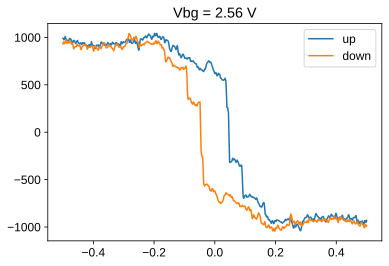

In [43]:
plt.figure()
indx = 19
plt.plot(Bint, (upsweeps[indx] - downsweeps[indx][::-1])/2, label='up')
plt.plot(Bint, (downsweeps[indx] - upsweeps[indx][::-1])/2, label='down')
plt.title('Vbg = {:.2f} V'.format(Vbg[indx]))
plt.legend()

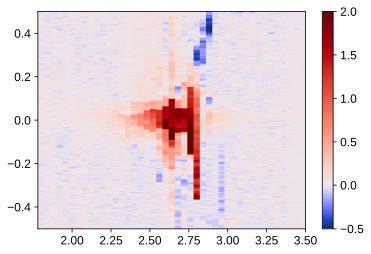

In [44]:
plt.figure()
plt.pcolormesh(Vbg, Bint, (upsweeps-downsweeps).T/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(0, -0.5, 2), rasterized=True)
plt.colorbar()

In [45]:
flistT = sorted(glob.glob('data/2020-12-10/#*/'))[51:53] + sorted(glob.glob('data/2020-12-10/#*/'))[54:56] + sorted(glob.glob('data/2020-12-10/#*/'))[58:84] + sorted(glob.glob('data/2020-12-10/#*/'))[86:] + sorted(glob.glob('data/2020-12-11/#*/'))
Tsb = np.concatenate(([0.025, 0.1, 0.3, 0.8, 1, 1.25, 1.5], np.linspace(2, 7.5, 23)))
Bint = np.linspace(-0.5, 0.5, 801)
# Vbg = 2.76
upsweepsT = np.zeros((int(len(flistT)/2), len(Bint)))
downsweepsT = np.zeros((int(len(flistT)/2), len(Bint)))
for i in range(int(len(flistT)/2)):
    dup = qc.load_data(flistT[2*i][:-1])
    ddown = qc.load_data(flistT[2*i + 1][:-1])
    dupint = np.where(np.isnan(dup.triton_field[:]))[0][0]
    ddownint = np.where(np.isnan(ddown.triton_field[:]))[0][0]
    Bup = dup.triton_field[:dupint]
    Bdown = ddown.triton_field[:ddownint]
    upsweepsT[i, :] = np.interp(Bint, Bup, dup.lockin830_X[:dupint])/1e-9
    downsweepsT[i, :] = np.interp(Bint, Bdown[::-1], ddown.lockin830_X[:ddownint][::-1])/1e-9

AttributeError: 'DataSet' object and its delegates have no attribute 'triton_field'

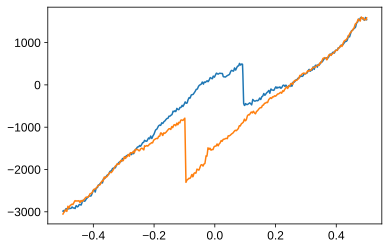

In [47]:
plt.figure()
plt.plot(Bint, upsweepsT[5])
plt.plot(Bint, downsweepsT[5])

TypeError: Dimensions of C (36, 801) are incompatible with X (801) and/or Y (30); see help(pcolormesh)

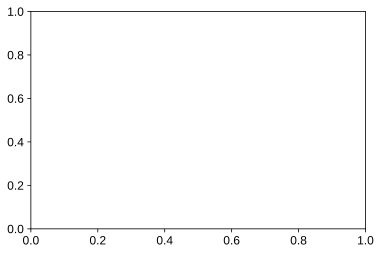

In [48]:
plt.figure()
plt.pcolormesh(Bint, Tsb, upsweepsT - downsweepsT)

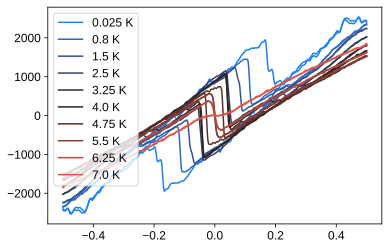

In [49]:
N = 10
cs = cc.cm.bkr([i/(N-1) for i in range(N)])

plt.figure()
for i in range(N):
    indx = 3*i
    Rxyup = gaussian_filter((upsweepsT[indx] - downsweepsT[indx][::-1])/2, 2)
    Rxydown = gaussian_filter((downsweepsT[indx] - upsweepsT[indx][::-1])/2, 2)
    plt.plot(Bint, Rxyup, color=cs[i], label='{} K'.format(Tsb[indx]))
    plt.plot(Bint, Rxydown, color=cs[i])
    
plt.legend()

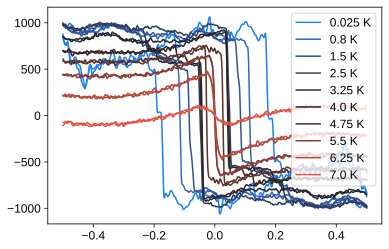

In [50]:
N = 10
cs = cc.cm.bkr([i/(N-1) for i in range(N)])

plt.figure()
for i in range(N):
    indx = 3*i
    Rxyup = gaussian_filter((upsweepsT[indx] - downsweepsT[indx][::-1])/2, 1.5)
    Rxydown = gaussian_filter((downsweepsT[indx] - upsweepsT[indx][::-1])/2, 1.5)
    linslope, b = np.polyfit(Bint[-200:], Rxyup[-200:], 1)
    plt.plot(Bint, Rxyup - linslope*Bint, color=cs[i], label='{} K'.format(Tsb[indx]))
    plt.plot(Bint, Rxydown - linslope*Bint, color=cs[i])
    
plt.legend()

## Rxy plots

-0.5T

In [8]:
d0 = qc.load_data('data/2020-12-31/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_base_3nA_gatesweep_-0p5T_15-14-12')
d1 = qc.load_data('data/2020-12-31/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweepto1K_Rxy-0p5T_15-31-16')
d2 = qc.load_data('data/2020-12-31/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p1to1p4K_Rxy-0p5T_20-59-14')
d3 = qc.load_data('data/2020-12-31/#004_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p5to2K_Rxy-0p5T_22-05-25')
d4 = qc.load_data('data/2021-01-01/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy-0p5T_00-23-35')
d5 = qc.load_data('data/2021-01-01/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy-0p5T_11-32-16')

vbgxy = d0.srframe_volt_p1_set[:]
Ts = np.concatenate(([0.025], d1.triton_pid_setpoint_set[:], d2.triton_pid_setpoint_set[:], d3.triton_pid_setpoint_set[:], d4.triton_pid_setpoint_set[:], d5.triton_pid_setpoint_set[:]))
Rxy2528_n = np.vstack((d0.lockin865_X[:], d1.lockin865_X[:, :], d2.lockin865_X[:, :], d3.lockin865_X[:, :], d4.lockin865_X[:, :], d5.lockin865_X[:, :]))/3e-9
Rxy229_n = np.vstack((d0.lockin830_X[:], d1.lockin830_X[:, :], d2.lockin830_X[:, :], d3.lockin830_X[:, :], d4.lockin830_X[:, :], d5.lockin830_X[:, :]))/3e-9
Rxy330_n = np.vstack((d0.lockin830_2_X[:], d1.lockin830_2_X[:, :], d2.lockin830_2_X[:, :], d3.lockin830_2_X[:, :], d4.lockin830_2_X[:, :], d5.lockin830_2_X[:, :]))/3e-9
Rxy431_n = np.vstack((d0.lockin830_3_X[:], d1.lockin830_3_X[:, :], d2.lockin830_3_X[:, :], d3.lockin830_3_X[:, :], d4.lockin830_3_X[:, :], d5.lockin830_3_X[:, :]))/3e-9


0.5T

In [9]:
d0_2 = qc.load_data('data/2020-12-29/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_base_3nA_gatesweep_21-58-23')
d1_2 = qc.load_data('data/2020-12-29/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweepto1K_Rxy0p5T_22-17-21')
d2_2 = qc.load_data('data/2020-12-30/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p1to1p4K_Rxy0p5T_03-45-27')
d3_2 = qc.load_data('data/2020-12-30/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p5to2K_Rxy0p5T_04-51-41')
d4_2 = qc.load_data('data/2020-12-30/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy0p5T_09-50-17')
d5_2 = qc.load_data('data/2020-12-30/#004_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy0p5T_20-46-45')

Ts_p = np.concatenate(([0.025], d1_2.triton_pid_setpoint_set[:], d2_2.triton_pid_setpoint_set[:], d3_2.triton_pid_setpoint_set[:], d4_2.triton_pid_setpoint_set[:], d5_2.triton_pid_setpoint_set[:]))
Rxy2528_p = np.vstack((d0_2.lockin865_X[:], d1_2.lockin865_X[:, :], d2_2.lockin865_X[:, :], d3_2.lockin865_X[:, :], d4_2.lockin865_X[:, :], d5_2.lockin865_X[:, :]))/3e-9
Rxy229_p = np.vstack((d0_2.lockin830_X[:], d1_2.lockin830_X[:, :], d2_2.lockin830_X[:, :], d3_2.lockin830_X[:, :], d4_2.lockin830_X[:, :], d5_2.lockin830_X[:, :]))/3e-9
Rxy330_p = np.vstack((d0_2.lockin830_2_X[:], d1_2.lockin830_2_X[:, :], d2_2.lockin830_2_X[:, :], d3_2.lockin830_2_X[:, :], d4_2.lockin830_2_X[:, :], d5_2.lockin830_2_X[:, :]))/3e-9
Rxy431_p = np.vstack((d0_2.lockin830_3_X[:], d1_2.lockin830_3_X[:, :], d2_2.lockin830_3_X[:, :], d3_2.lockin830_3_X[:, :], d4_2.lockin830_3_X[:, :], d5_2.lockin830_3_X[:, :]))/3e-9


In [10]:
nHall2528 = (1.602e-19*(Rxy2528_p - Rxy2528_n + 25))**-1/10**16
nHall229 = (1.602e-19*(Rxy229_p - Rxy229_n + 25))**-1/10**16
nHall330 = (1.602e-19*(Rxy330_p - Rxy330_n + 25))**-1/10**16
nHall431 = (1.602e-19*(Rxy431_p - Rxy431_n + 25))**-1/10**16

In [11]:
V0 = 0.51
Vgatefull = 10.04
nu2528 = np.interp(vbgxy, [V0 - Vgatefull*6/4, V0 + Vgatefull*6/4], [-6, 6])

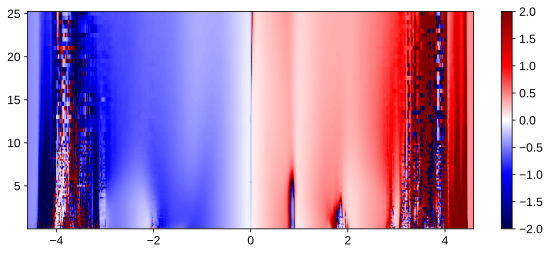

In [12]:
plt.figure(figsize=(10, 4))
plt.pcolormesh(nu2528, Ts, nHall2528, cmap='seismic', norm=TwoSlopeNorm(0, -2, 2), rasterized=True)
plt.colorbar()

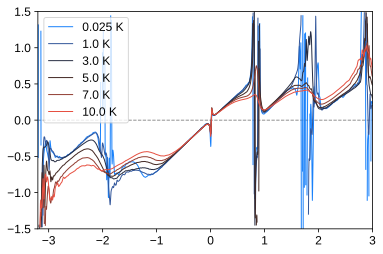

In [13]:
indxlist = [0, 20, 35, 45, 55, 70]
N = len(indxlist)
cs = cc.cm.bkr([i/(N-1) for i in range(N)])
xmin, xmax = -3.2, 3
ymin, ymax = -1.5, 1.5
xpts = np.linspace(xmin, xmax, 3001)

lw = 1
plt.figure()
for i in range(N):
    indx = indxlist[i]
    ypts = gaussian_filter(np.interp(xpts, nu2528, nHall2528[indx, :]), 1.5)
#     plt.plot(nu2528, nHall2528[indx, :], label='{} K'.format(Ts[indx]), lw=lw, color=cs[i])
    plt.plot(xpts, np.ma.masked_outside(ypts, ymin, ymax), label='{} K'.format(Ts[indx]), lw=lw, color=cs[i])

plt.hlines(0, -3.2, 3, color='gray', linestyles='dashed', lw=0.9)
plt.axis((xmin, xmax, ymin, ymax))
plt.legend()

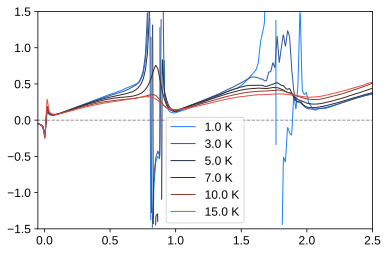

In [14]:
indxlist = [20, 35, 45, 55, 70, 80]
N = len(indxlist)
cs = cc.cm.bkr([i/(N-1) for i in range(N)])
xmin, xmax = -0.05, 2.5
ymin, ymax = -1.5, 1.5
xpts = np.linspace(xmin, xmax, 3001)

lw = 1
plt.figure()
for i in range(N):
    indx = indxlist[i]
    ypts = gaussian_filter(np.interp(xpts, nu2528, nHall2528[indx, :]), 1.5)
#     plt.plot(nu2528, nHall2528[indx, :], label='{} K'.format(Ts[indx]), lw=lw, color=cs[i])
    plt.plot(xpts, np.ma.masked_outside(ypts, ymin, ymax), label='{} K'.format(Ts[indx]), lw=lw, color=cs[i])

plt.hlines(0, -3.2, 3, color='gray', linestyles='dashed', lw=0.9)
plt.axis((xmin, xmax, ymin, ymax))
plt.legend()

Include Rxx to get $\sigma_{xy}$ (symmetrized) --- except we need Rxx taken at the same field as Rxy

### Other contacts

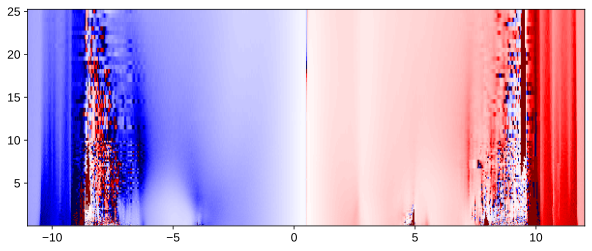

In [15]:
plt.figure(figsize=(10, 4))
plt.pcolormesh(vbgxy, Ts, nHall229, cmap='seismic', norm=TwoSlopeNorm(0, -4, 4), rasterized=True)

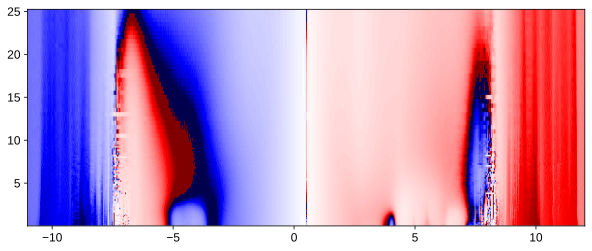

In [16]:
plt.figure(figsize=(10, 4))
plt.pcolormesh(vbgxy, Ts, nHall330, cmap='seismic', norm=TwoSlopeNorm(0, -4, 4), rasterized=True)

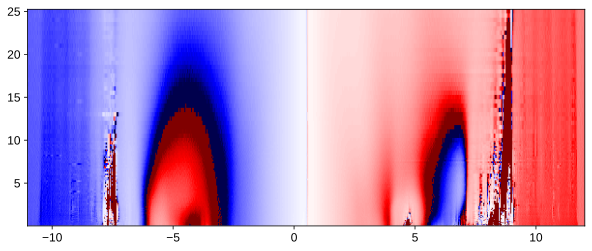

In [17]:
plt.figure(figsize=(10, 4))
plt.pcolormesh(vbgxy, Ts, nHall431, cmap='seismic', norm=TwoSlopeNorm(0, -4, 4), rasterized=True)

# Contacs 2-3 1.04$^\circ$

In [10]:
d_S13_Fan_1 = dfan1
d_S13_Fan_2 = dfan2
d_S13_Fan_3 = dfan3

In [11]:
Bfield = np.concatenate((d_S13_Fan_1.triton_field_set_stable_set[:45], d_S13_Fan_2.triton_field_set_stable_set[1:59], d_S13_Fan_3.triton_field_set_stable_set[1:]))
gate = d_S13_Fan_1.srframe_volt_p1_set[0, :]
Rxx0302 = np.vstack((npd.Rxxfromdata(d_S13_Fan_1, 1e-9, 'lockin865')[:45], npd.Rxxfromdata(d_S13_Fan_2, 1e-9, 'lockin865')[1:59], npd.Rxxfromdata(d_S13_Fan_3, 1e-9, 'lockin865')[1:]))

In [12]:
indices = [i not in (21, 22) for i in range(len(Bfield))]
Rxx0302funcgate = RectBivariateSpline(gate, Bfield[indices], Rxx0302[indices, :].T, kx=1, ky=1)

In [13]:
sl = 11.6
def plotline(slope, xintercept, Bl, Bs, *args, **kwargs):
    "Note that slope is actually 1/(actual slope)"
    b = -xintercept*sl
    x = np.linspace((Bs*slope - b)/sl, (Bl*slope - b)/sl, 5)
    plt.plot(x, (x*sl + b)/slope, *args, **kwargs)

(0, 8)

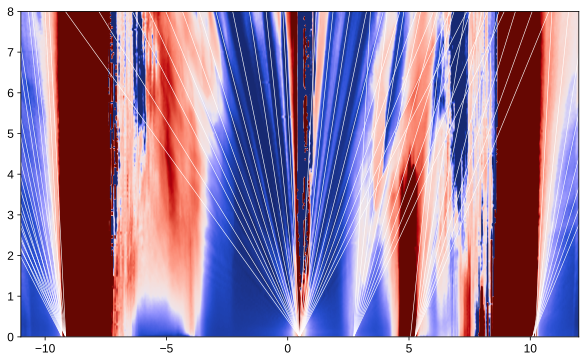

In [37]:
x = np.linspace(-11, 12, 1501)
y = np.linspace(0, 8, 601)

plt.figure(figsize=(10, 6))
plt.pcolormesh(x, y, gaussian_filter(Rxx0302funcgate(x, y).T, (0.5, 0.5))/1000, norm=TwoSlopeNorm(3, vmin=0, vmax=20), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)

sl = 11.6
V0 = 0.49
V1q = 2.72
Vhalf = 5.25
Vhalf2 = V0 + (V1q-V0)*2

for i in np.concatenate(([-14, -12], np.arange(-10, 0), np.arange(1, 11))):
    plotline(i, V0, 0, 8, lw=0.6, color='white')
    
for i in range(1, 10):
    plotline(i, V1q, 0, 8, lw=0.6, color='white')
    
plotline(2, 5.06, 0, 8, lw=0.6, color='white')
    
for i in range(2, 9): # this lines up ok with some of the higher LLs, but not as well with nu=2 at high fields
    plotline(i, Vhalf, 0, 8, lw=0.6, color='white')

for i in range(1, 4):
    plotline(i, 10.2, 0, 8, lw=0.6, color='white')
    
for i in range(4, 9):
    plotline(i, 10.1, 0, 8, lw=0.6, color='white')
    
for i in range(-10, 0):
    plotline(i, -9.15, 0, 8, lw=0.6, color='white')
    
for i in range(-10, 0):
    plotline(i, -9.31, 0, 8, lw=0.6, color='white')
    
plt.xlim(-11, 12)
plt.ylim(0, 8)

In [39]:
Vhalf2

4.950000000000001

In [34]:
(V1q - V0)*4

8.920000000000002

In [40]:
V0 = 0.49
Vgatefull = 9 #using the quarter filling point (at least the one that points to the C=3 part, and it's closer to matching the -1/2 peak
sl = 11.6
C = sl*1.602e-19**2/6.626e-34
print('Capacitance C: {:.4e} F/m^2'.format(C))
dbn = 8.85e-12*3/C*1e9
print('hBN effective thickness: {:.2f} nm'.format(dbn))
nfull = sl*1.602e-19/6.626e-34*Vgatefull*1e-4
print('Full filling density: {:.4f} 10^12 cm^-2'.format(nfull/1e12))
a = 0.246e-9
theta = np.sqrt(np.sqrt(3)*nfull*10**4*a**2/8)*180/np.pi
print('Theta = {:.3f} degrees'.format(theta))

Capacitance C: 4.4929e-04 F/m^2
hBN effective thickness: 59.09 nm
Full filling density: 2.5241 10^12 cm^-2
Theta = 1.042 degrees


In [41]:
nugate0302 = np.interp(gate, [V0 - Vgatefull*6/4, V0 + Vgatefull*6/4], [-6, 6])
Rxx0302funcnu = RectBivariateSpline(nugate0302, Bfield[indices], Rxx0302[indices, :].T, kx=1, ky=1)

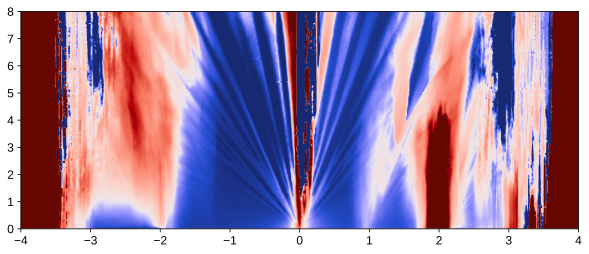

In [42]:
x = np.linspace(-4, 4, 1501)
y = np.linspace(0, 8, 601)

plt.figure(figsize=(10, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxx0302funcnu(x, y).T, (0.5, 0.5))/1000, norm=TwoSlopeNorm(3, vmin=0, vmax=20), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)


# Contacts 4-3

In [43]:
V0 = 0.5
Vgatefull = 7.76 #using the quarter filling point (at least the one that points to the C=3 part, and it's closer to matching the -1/2 peak
sl = 11.6
C = sl*1.602e-19**2/6.626e-34
print('Capacitance C: {:.4e} F/m^2'.format(C))
dbn = 8.85e-12*3/C*1e9
print('hBN effective thickness: {:.2f} nm'.format(dbn))
nfull = sl*1.602e-19/6.626e-34*Vgatefull*1e-4
print('Full filling density: {:.4f} 10^12 cm^-2'.format(nfull/1e12))
a = 0.246e-9
theta = np.sqrt(np.sqrt(3)*nfull*10**4*a**2/8)*180/np.pi
print('Theta = {:.3f} degrees'.format(theta))

Capacitance C: 4.4929e-04 F/m^2
hBN effective thickness: 59.09 nm
Full filling density: 2.1764 10^12 cm^-2
Theta = 0.968 degrees


Run the datasets from contacts 2-25, and 2-3 to get this to work

In [44]:
Bfield = np.concatenate((d_S13_Fan_1.triton_field_set_stable_set[:45], d_S13_Fan_2.triton_field_set_stable_set[1:59], d_S13_Fan_3.triton_field_set_stable_set[1:]))
gate = d_S13_Fan_1.srframe_volt_p1_set[0, :]
Rxx0403 = np.vstack((npd.Rxxfromdata(d_S13_Fan_1, 1e-9, 'lockin830_2')[:45,:], npd.Rxxfromdata(d_S13_Fan_2, 1e-9, 'lockin830_2')[1:59,:], npd.Rxxfromdata(d_S13_Fan_3, 1e-9, 'lockin830_2')[1:,:]))

In [45]:
Vgatefull0403 = 7.76
V00403 = 0.5

In [46]:
nugate0403 = np.interp(gate, [V00403 - Vgatefull0403*6/4, V00403 + Vgatefull0403*6/4], [-6, 6])
indices = [i not in (21, 22) for i in range(len(Bfield))]
Rxx0403Bfuncgate = RectBivariateSpline(gate, Bfield[indices], Rxx0403[indices, :].T, kx=1, ky=1)
Rxx0403Bfunc = RectBivariateSpline(nugate0403, Bfield[indices], Rxx0403[indices, :].T, kx=1, ky=1)

In [47]:
gate[0]

-11.0

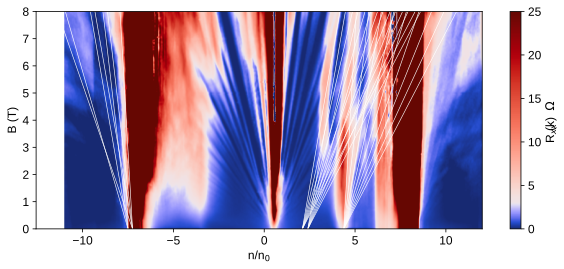

In [48]:
x = np.linspace(-11, 12, 1000)
y = np.linspace(0, 8, 600)
Rxx0403Bint = Rxx0403Bfuncgate(x, y).T

plt.figure(figsize=(10, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxx0403Bint, (1.2, 1.2))/1000, norm=TwoSlopeNorm(3, vmin=0, vmax=25), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel('n/n$_0$')
plt.ylabel('B (T)')
# plt.xticks([-4, -3, -2, -1, 0, 1, 2, 3, 4])     
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)
#plt.savefig(figfile + 'S13_1p09_Rxx0225_Fan.svg', dpi=300, bbox_inches='tight')

sl = 11.6
V0 = 0.5
V1q = 2.1
V1q_2 = 2.4
Vhalf = 4.38

# for i in np.concatenate(([-14, -12], np.arange(-10, 0), np.arange(1, 15))):
#     plotline(i, V0, 0, 8, lw=0.6, color='white')
    
for i in range(3, 10):
    plotline(i, V1q, 0, 8, lw=0.6, color='white')
    
for i in range(3, 10):
    plotline(i, V1q_2, 0, 8, lw=0.6, color='white')
    
for i in range(1, 10):
    plotline(i, Vhalf, 0, 8, lw=0.6, color='white')
    
for i in [-2, -3, -5]:
    plotline(i, -7.5, 0, 8, lw=0.6, color='white')
    
for i in [-1, -2, -3, -6]:
    plotline(i, -7.25, 0, 8, lw=0.6, color='white')
    

In [51]:
Vgatefull = (Vhalf - V0)*2
Vgatefull

7.76

In [52]:
V0 - (Vhalf - V0)*2

-7.26

# S12

In [18]:
d_S12_Fan_1 = qc.load_data('data/2020-11-23/#006_S12_865_19-17_830_17-16_8302_16-14_8303_10-16_base_1nA_Landaufan_16-55-29')
d_S12_Fan_2 = qc.load_data('data/2020-11-25/#001_S12_865_19-17_830_17-16_8302_16-14_8303_10-16_base_1nA_Landaufan_00-12-33')

In [19]:
Bfield = np.concatenate((d_S12_Fan_1.triton_field_set_stable_set[:], d_S12_Fan_2.triton_field_set_stable_set[:-1], [8]))
gate = d_S12_Fan_1.srframe_volt_p1_set[0, :]
Rxx1614 = np.vstack((npd.Rxxfromdata(d_S12_Fan_1, 1e-9, 'lockin830_2'), npd.Rxxfromdata(d_S12_Fan_2, 1e-9, 'lockin830_2')))
indices = [i not in (21, 22) for i in range(len(Bfield))]
# Rxx1614[Rxx1614 < 0] = np.min(np.abs(Rxx1614))
Rxx1614func = RectBivariateSpline(gate, Bfield[indices], Rxx1614[indices, :].T, kx=1, ky=1)

In [20]:
sl = 10.55
def plotline(slope, xintercept, Bl, Bs, *args, **kwargs):
    "Note that slope is actually 1/(actual slope)"
    b = -xintercept*sl
    x = np.linspace((Bs*slope - b)/sl, (Bl*slope - b)/sl, 5)
    plt.plot(x, (x*sl + b)/slope, *args, **kwargs)

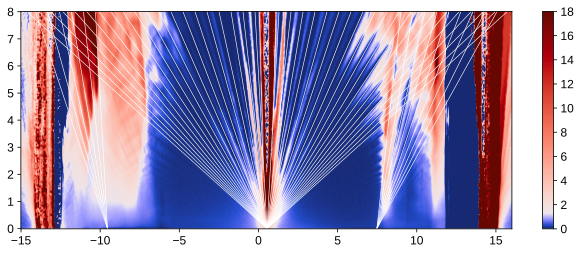

In [21]:
x = np.linspace(-15, 16, 1501)
y = np.linspace(0, 8, 401)

plt.figure(figsize=(11, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxx1614func(x, y).T, (0.5, 0.5))/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(1.3, 0, 18), rasterized=True)
plt.colorbar()

lw = 0.6
V0 = 0.54
Vhalf = 7.48
Vgatefull = (Vhalf - V0)*2
Vn34 = -9.54

for i in np.concatenate((np.arange(-20, 0), np.arange(1, 21))):
    plotline(i, V0, 8, 0, lw=lw, color='white')
    
for i in range(2, 11):
    plotline(i, Vhalf, 8, 0, lw=lw, color='white')
    
# for i in range(-8, -1):
#     plotline(i, V0 - Vgatefull/2, 8, 0, lw=lw, color='white')
    
for i in range(-6,0):
    plotline(i, Vn34, 8, 0, lw=lw, color='white')
    
# for i in range(5, 15):
#     plotline(i, V0 - Vgatefull, 8, 0, lw=lw, color='white')
    
# for i in range(1, 7):
#     plotline(i, 15, 8, 0, lw=lw, color='white')
    
# plotline(1, 10.67, 8, 0, lw=lw, color='white')
    
# plt.axis(ab)

In [22]:
# ab = plt.axis()

In [23]:
V0 + Vgatefull*3/4

10.95

In [24]:
V0 + 13.4666666*3/4

10.63999995

In [25]:
Vgatefull

13.88

In [26]:
(V0 - Vn34)*4/3 # Vgatefull derived from the negative 3/4 state

13.439999999999998

In [27]:
(15 - V0) # Vgatefull derived from the + full filling fan

14.46

Smaller angle area 1.14 deg

In [28]:
Bfield = np.concatenate((d_S12_Fan_1.triton_field_set_stable_set[:], d_S12_Fan_2.triton_field_set_stable_set[:]))
gate = d_S12_Fan_1.srframe_volt_p1_set[0, :]
Rxx1716 = abs(np.vstack((d_S12_Fan_1.lockin830_X[:,:]/1e-9, d_S12_Fan_2.lockin830_X[:,:]/1e-9)))

In [29]:
indices = [i not in (21, 22) for i in range(len(Bfield))]
Rxx1716Bfunc = RectBivariateSpline(gate, Bfield[indices], Rxx1716[indices, :].T, kx=1, ky=1)

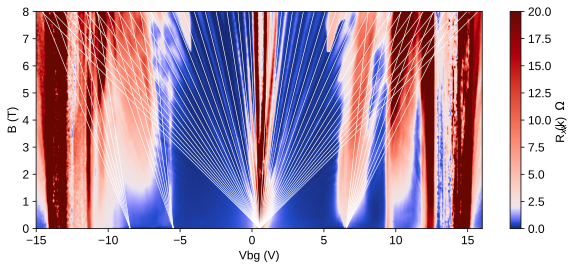

In [30]:
x = np.linspace(-15, 16, 1500)
y = np.linspace(0, 8, 600)
Rxx1716Bint = Rxx1716Bfunc(x, y).T

plt.figure(figsize=(10, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxx1716Bint, (1.2, 1.2))/1000, norm=TwoSlopeNorm(2, vmin=0, vmax=20), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel('Vbg (V)')
plt.ylabel('B (T)')

sl = 10.55
lw = 0.6
V0 = 0.54
Vhalf = 6.55
Vgatefull = (Vhalf - V0)*2
Vn34 = -9.54

for i in np.concatenate((np.arange(-20, 0), np.arange(1, 21))):
    plotline(i, V0, 8, 0, lw=lw, color='white')
    
for i in range(2, 11):
    plotline(i, Vhalf, 8, 0, lw=lw, color='white')

for i in range(-7, -1):
    plotline(i, V0 - Vgatefull/2, 8, 0, lw=lw, color='white')
    
for i in range(-8, -2):
    plotline(i, V0 - Vgatefull*3/4, 8, 0, lw=lw, color='white')
    
# for i in range(-6,0):
#     plotline(i, Vn34, 8, 0, lw=lw, color='white')

# plt.axis(ab)

In [31]:
Vgatefull

12.02

In [33]:
Vgatefull1716 = 12.02
V01716 = 0.54

In [34]:
nugate1716 = np.interp(gate, [V01716 - Vgatefull1716*6/4, V01716 + Vgatefull1716*6/4], [-6, 6])

In [35]:
Rxx1716Bfunc = RectBivariateSpline(nugate1716, Bfield, Rxx1716.T, kx=1, ky=1)

([<matplotlib.axis.XTick at 0x7fea5fae3460>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

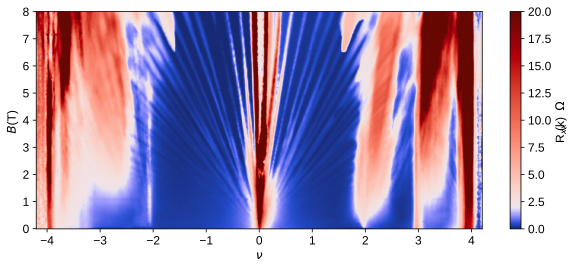

In [36]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0, 8, 600)
Rxx1716Bint = Rxx1716Bfunc(x, y).T

plt.figure(figsize=(10, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxx1716Bint, (1.2, 1.2))/1000, norm=TwoSlopeNorm(2, vmin=0, vmax=20), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.xticks([-4, -3, -2, -1, 0, 1, 2, 3, 4])     
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)
#plt.savefig(figfile + 'S13_1p09_Rxx0225_Fan.svg', dpi=300, bbox_inches='tight')